In [1]:
#learn gung fu
import numpy as np
import pandas as pd
pd.options.display.max_columns = 61
pd.options.display.max_rows = 61

import matplotlib.pyplot as plt
import seaborn as sns
import mason_functions as mf
import explore
import wrangle
import scale 

# Wrangle

In [2]:
#load data
df = pd.read_csv('employee_attrition.xls')

#preview data
df.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [3]:
#get dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

I want to explore differences in model performance from discrete features. I will make a list of out of the discrete variables. For items in this list, the item can be measured on a scale from 1 to 4 (except the education, that is on a scale of 1 to 5), or the item can be viewed as a category.

I want to get a feel for the data I am about to explore, and I would like to separate the data into numeric, categorical and discrete features. I will now loop through all of the columns to get a better feel as to what's available and what goes where.

In [4]:
#loop through columns to print number of unique values that each feature has
for col in df.columns:
    print(f'{col}: {df[col].nunique()}')
    print('---')

Age: 43
---
Attrition: 2
---
BusinessTravel: 3
---
DailyRate: 886
---
Department: 3
---
DistanceFromHome: 29
---
Education: 5
---
EducationField: 6
---
EmployeeCount: 1
---
EmployeeNumber: 1470
---
EnvironmentSatisfaction: 4
---
Gender: 2
---
HourlyRate: 71
---
JobInvolvement: 4
---
JobLevel: 5
---
JobRole: 9
---
JobSatisfaction: 4
---
MaritalStatus: 3
---
MonthlyIncome: 1349
---
MonthlyRate: 1427
---
NumCompaniesWorked: 10
---
Over18: 1
---
OverTime: 2
---
PercentSalaryHike: 15
---
PerformanceRating: 2
---
RelationshipSatisfaction: 4
---
StandardHours: 1
---
StockOptionLevel: 4
---
TotalWorkingYears: 40
---
TrainingTimesLastYear: 7
---
WorkLifeBalance: 4
---
YearsAtCompany: 37
---
YearsInCurrentRole: 19
---
YearsSinceLastPromotion: 16
---
YearsWithCurrManager: 18
---


In [5]:
#loop through columns, and print out values and counts for each feature
for col in df.columns:
    print(col)
    print('---')
    print(df[col].value_counts().sort_index(ascending = False))
    print('==============')
    print('              ')

Age
---
60     5
59    10
58    14
57     4
56    14
55    22
54    18
53    19
52    18
51    19
50    30
49    24
48    19
47    24
46    33
45    41
44    33
43    32
42    46
41    40
40    57
39    42
38    58
37    50
36    69
35    78
34    77
33    58
32    61
31    69
30    60
29    68
28    48
27    48
26    39
25    26
24    26
23    14
22    16
21    13
20    11
19     9
18     8
Name: Age, dtype: int64
              
Attrition
---
Yes     237
No     1233
Name: Attrition, dtype: int64
              
BusinessTravel
---
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64
              
DailyRate
---
1499    1
1498    1
1496    2
1495    3
1492    1
       ..
106     1
105     1
104     1
103     1
102     1
Name: DailyRate, Length: 886, dtype: int64
              
Department
---
Sales                     446
Research & Development    961
Human Resources            63
Name: Department, dtype: int64
              
Dis

In [6]:
#set a list of categorical columns based on the columns above
categorical = ['attrition',
               'business_travel',
               'department',
               'education_field',
               'gender',
               'job_role',
               'marital_status',
               'overtime'
              ]

#set a list of discrete columns
discrete = ['education',
            'environment_satisfaction',
            'job_involvement',
            'job_level',
            'job_satisfaction',
            'performance_rating',
            'relationship_satisfaction', 
            'stock_option_level',
            'work_life_balance'
           ]

#set a list of numeric columns
numeric = ['age',
           'daily_rate',
           'distance_from_home',
           'education',
           'environment_satisfaction',
           'hourly_rate',
           'job_involvement',
           'job_level',
           'job_satisfaction',
           'monthly_income',
           'monthly_rate',
           'companies_worked',
           'percent_salary_hike',
           'performance_rating',
           'relationship_satisfaction',
           'stock_option_level',
           'total_working_years',
           'hours_trained_last_year',
           'work_life_balance',
           'company_years',
           'current_role_years',
           'years_since_last_promotion',
           'years_with_manager'
          ]

## Wrangle: Finished

In [7]:
#pull in datasets
df, train, validate, test = wrangle.prepare_attrition()

In [8]:
for cat in categorical:
    print(cat)
    print('---')
    print(df[cat].value_counts())
    print('==============')
    print('              ')

attrition
---
0    1233
1     237
Name: attrition, dtype: int64
              
business_travel
---
Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: business_travel, dtype: int64
              
department
---
Research & Development    961
Sales                     446
Human Resources            63
Name: department, dtype: int64
              
education_field
---
Life Sciences       606
Medical             464
Marketing           159
Technical Degree    132
Other                82
Human Resources      27
Name: education_field, dtype: int64
              
gender
---
Male      882
Female    588
Name: gender, dtype: int64
              
job_role
---
Sales Executive              326
Research Scientist           292
Laboratory Technician        259
Manufacturing Director       145
Healthcare Representative    131
Manager                      102
Sales Representative          83
Research Director             80
Human Resources               52
Name: job_role,

# Explore

### Initial Questions
I. What is the total percentage of attrition? What is attrition like across departments?

II. Are any departments associated with attrition?

III. What is job satisfacton like for employees part ways with the company?

IV. What is relationship satisfaction like for employees who depart?

V. How does daily rate (daily income) compare for employees who leave vs those who do not?

VI. How does average total working hours compare across employees who leave vs those who don't?

VII. How do performance ratings compare between departed and retained employees?

VII. How does distance from home affect employee attrition?

In [9]:
#preview unsplit data
df.head()

,age,attrition,business_travel,daily_rate,department,distance_from_home,education,education_field,environment_satisfaction,gender,hourly_rate,job_involvement,job_level,job_role,job_satisfaction,marital_status,monthly_income,monthly_rate,companies_worked,overtime,percent_salary_hike,performance_rating,relationship_satisfaction,stock_option_level,total_working_years,hours_trained_last_year,work_life_balance,company_years,current_role_years,years_since_last_promotion,years_with_manager,travel_none,travel_frequently,travel_rarely,hr_dept,research_dev_dept,sales_dept,hr_ed,life_sciences_ed,marketing_ed,medical_ed,other_ed,tech_deg_ed,female,healthcare_rep_job,hr_job,lab_tech_job,manager_job,manufacturing_dir_job,research_dir_job,research_scientist_job,sales_exec_job,sales_rep_job,divorced,married,single
employee_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,41,1,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,1,11,3,1,0,8,0,1,6,4,0,5,0,0,1,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1
2,49,0,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,0,23,4,4,1,10,3,3,10,7,1,7,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
4,37,1,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,1,15,3,2,0,7,3,3,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1
5,33,0,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,1,11,3,3,0,8,3,3,8,7,3,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0
7,27,0,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,0,12,3,4,1,6,3,3,2,2,2,2,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0


In [10]:
#juxtapose subset shapes
train.shape, validate.shape, test.shape

((823, 56), (353, 56), (294, 56))

In [11]:
#preview train set
train.head()

,age,attrition,business_travel,daily_rate,department,distance_from_home,education,education_field,environment_satisfaction,gender,hourly_rate,job_involvement,job_level,job_role,job_satisfaction,marital_status,monthly_income,monthly_rate,companies_worked,overtime,percent_salary_hike,performance_rating,relationship_satisfaction,stock_option_level,total_working_years,hours_trained_last_year,work_life_balance,company_years,current_role_years,years_since_last_promotion,years_with_manager,travel_none,travel_frequently,travel_rarely,hr_dept,research_dev_dept,sales_dept,hr_ed,life_sciences_ed,marketing_ed,medical_ed,other_ed,tech_deg_ed,female,healthcare_rep_job,hr_job,lab_tech_job,manager_job,manufacturing_dir_job,research_dir_job,research_scientist_job,sales_exec_job,sales_rep_job,divorced,married,single
employee_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
791,52,0,Non-Travel,715,Research & Development,19,4,Medical,4,Male,41,3,1,Research Scientist,4,Married,4258,26589,0,0,18,3,1,1,5,3,3,4,3,1,2,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0
505,55,0,Travel_Rarely,1311,Research & Development,2,3,Life Sciences,3,Female,97,3,4,Manager,4,Single,16659,23258,2,1,13,3,3,0,30,2,3,5,4,1,2,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1
900,37,0,Travel_Frequently,1231,Sales,21,2,Medical,3,Female,54,3,1,Sales Representative,4,Married,2973,21222,5,0,15,3,2,1,10,3,3,5,4,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0
1684,23,1,Travel_Rarely,1320,Research & Development,8,1,Medical,4,Male,93,2,1,Laboratory Technician,3,Single,3989,20586,1,1,11,3,1,0,5,2,3,5,4,1,2,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
712,48,0,Travel_Rarely,817,Sales,2,1,Marketing,2,Male,56,4,2,Sales Executive,2,Married,8120,18597,3,0,12,3,4,0,12,3,3,2,2,2,2,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0


In [12]:
#recap on numeric columns
numeric

['age',
 'daily_rate',
 'distance_from_home',
 'education',
 'environment_satisfaction',
 'hourly_rate',
 'job_involvement',
 'job_level',
 'job_satisfaction',
 'monthly_income',
 'monthly_rate',
 'companies_worked',
 'percent_salary_hike',
 'performance_rating',
 'relationship_satisfaction',
 'stock_option_level',
 'total_working_years',
 'hours_trained_last_year',
 'work_life_balance',
 'company_years',
 'current_role_years',
 'years_since_last_promotion',
 'years_with_manager']

Education
* 1 'Below College'
* 2 'College'
* 3 'Bachelor'
* 4 'Master'
* 5 'Doctor'

EnvironmentSatisfaction, JobInvolvement, JobSatisfaction, RelationshipSatisfaction 
* 1 'Low'
* 2 'Medium'
* 3 'High'
* 4 'Very High'

PerformanceRating 
* 1 'Low'
* 2 'Good'
* 3 'Excellent'
* 4 'Outstanding'

 
WorkLifeBalance 
* 1 'Bad'
* 2 'Good'
* 3 'Better'
* 4 'Best'

Univariate Distributions


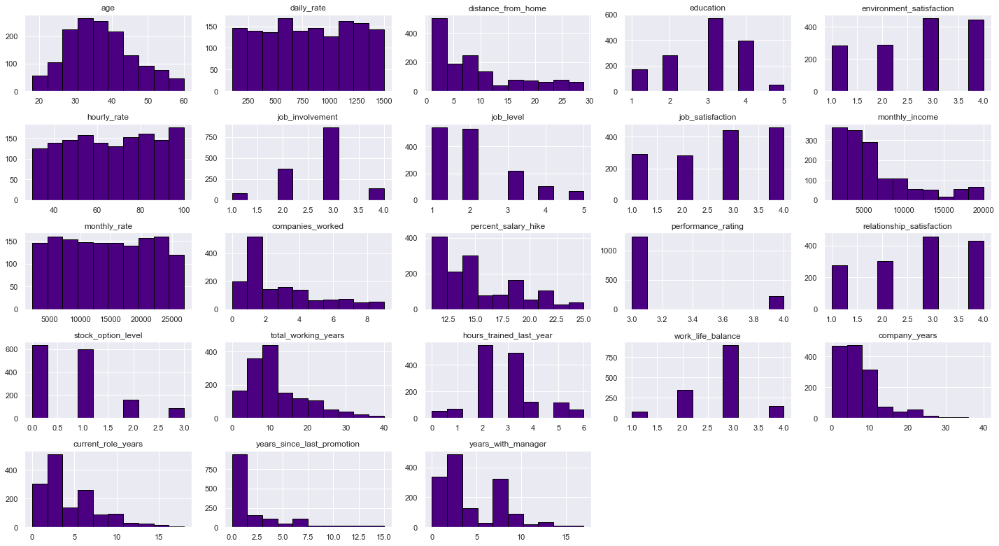

In [13]:
#loop through numeric features to view distributions
explore.distributions_plot(df, numeric)
print('Univariate Distributions')

### Distributions Takeaways
First row:
* age is normally distributed
* daily rate is pretty uniformly distributed
* most people work close to home
* most employees have a bachelor's degree (close to 600) and then more have a master's (approx 400) than those with a 'college' education (around 300) and then a few hundred have 'below college' for education, and then around 50 have a doctorate
* around 300 people have low satsifaction with the environment, around 300 have medium satisfaction-- but around 500 people have high satisfaction and around 500 people have very high satisfaction with the environment

Second row:
* hourly rate seems uniformally distributed, with slight majority of employees (just shy of 200) having an hourly rate of 100
* Most employees are highly involved with their job
* Most employees are 1st and 2nd level jobs and around 200 employees have a third level job
* Around 300 employees each have low or medium satisfaction, but most people (around 500 each) have high or very high satisfaction
* majority of monthly incomes are 5000 or below


Third row:
* no surprise, monthly rate is also pretty uniformly distributed
* majority of employees have worked at one company, otherwise pretty uniformly distributed from 0-9
* salary hike percentage is skewed to the right, with most employees having relatively low percentage hike in salary
* most employees have performances rated at 'excellent,' but there are around 200 or so with a performance rating of 'outstanding.'
* around 500 or so each have high or very high satisfaction with their relationship, around 300 each have low and medium satisfaction


Fourth row:
* majority of employees own 0 or few stocks from company
* total working years hist is skewed to the right, with majority of employees having 5-10 years of work under their belt (xticks end at 40 for this chart)
* majority of employees trained 2-3 hours last year
* majority of employees rate their work life balance as 'better' (over 800) and around 400 rate it as 'good'
* majority of employees have been with the company for 10 or less years

Fifth row:
* majority of employees have 2-3 years in their current role, chart is heavily skewed to the right
* majority of employees have 0 years since their last promotion, chart is heavily skewed to the right (otherwise uniformly distributed aside from employees with 0-1 years since last promo)
* majority of employees have 2 years with the current manager, and those with 7 years and 0 have similar groupsizes, other than that the chart is pretty randomly distributed 

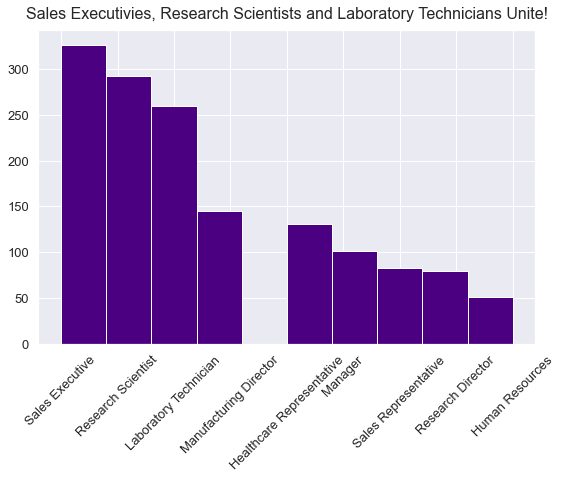

In [14]:
#create larger figure for clarity
plt.figure(figsize = (8, 5))

#induce histogram
df.job_role.hist(color = 'indigo')

#clear it up
plt.tight_layout()

#rotate x-axis ticks 45 degrees, increase size for readability
plt.xticks(rotation = 45, size = 13)

#increase y-axis tick size for readability
plt.yticks(size = 13)

#title
plt.title('Sales Executivies, Research Scientists and Laboratory Technicians Unite!', size = 16, pad = 11);

* The majority of jobs are held by sales executives, research scientists, laboratory technicians

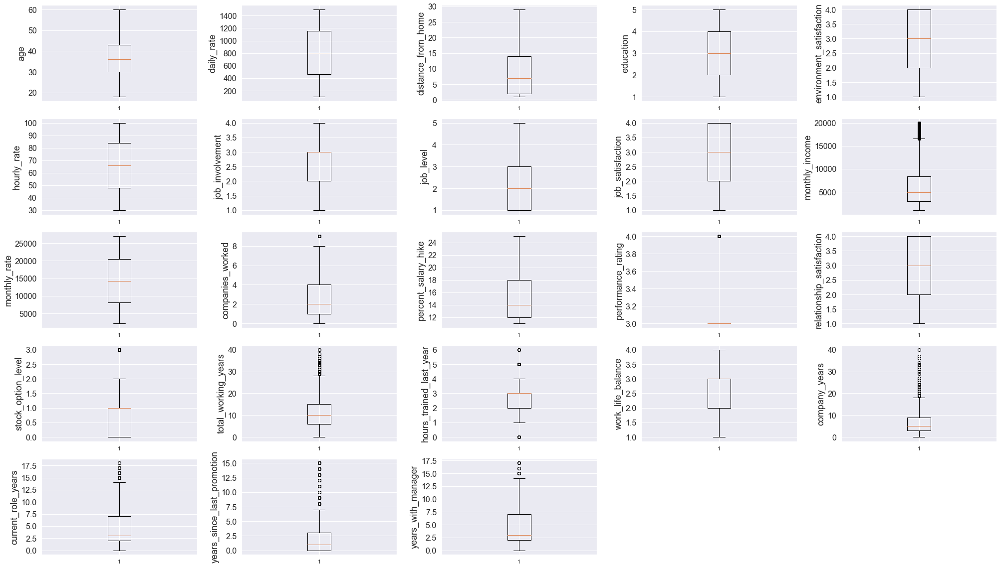

In [15]:
#view boxplot distributions
explore.boxplot_grid(df, numeric)

### Takeaways
* boxplot distributions supplement my knowledge of histogram distributions with median and IQR, and it looks like I have outliers in the data

Outliers present in:
* monthly income (lots of outliers here)
* number of companies worked at
* performance rating
* total working years
* years at the company
* years in current role
* years since last promotion
* years with current manager

I will leave the outliers be for now. There aren't very many outliers pressent except for monthly distribution (ok there are lots of outliers), and I would like to include all data in my first models. I will use a robust scaler with high hopes.

Let's look at pairwise relationships-- specifically, linear relationships between continuous variables, and let's hue in the target variable to see if we can glean any insights.

In [16]:
#add target variable to continuous columns to hue in pairplot
numeric.append('attrition')

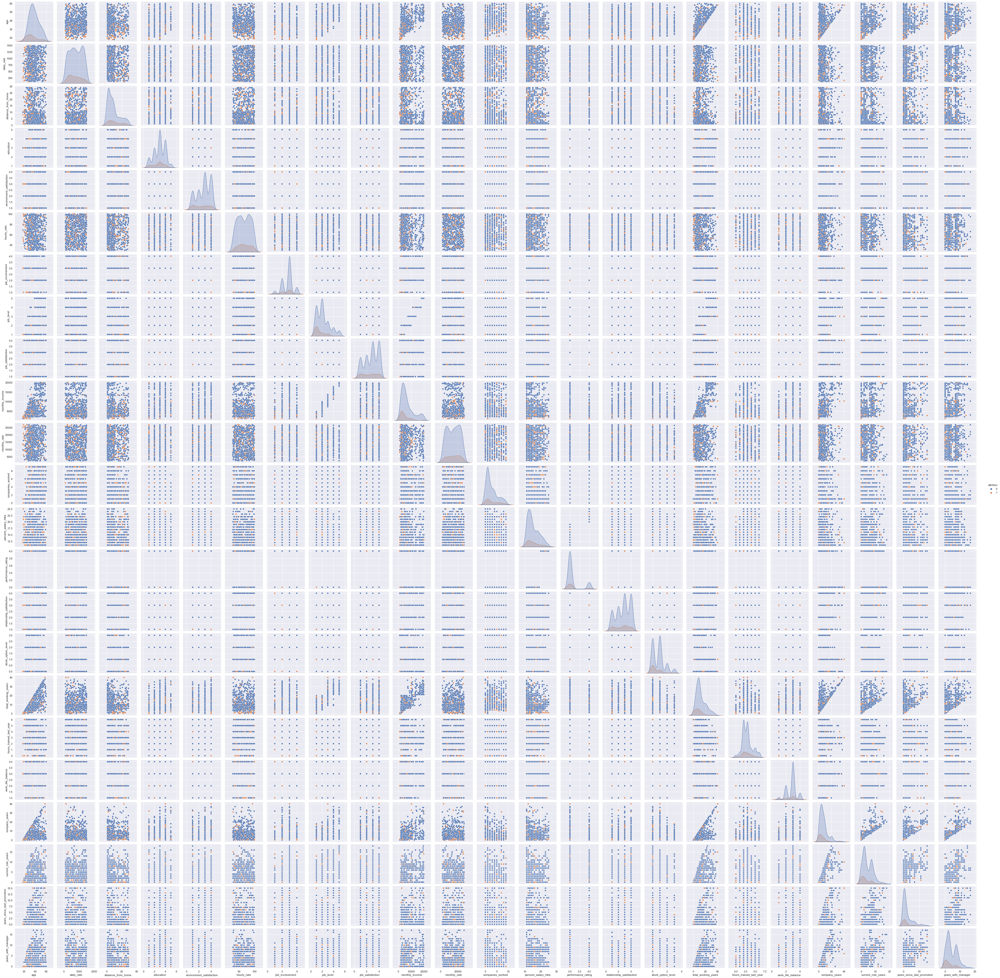

In [17]:
#run pairplot, hue target variable
sns.pairplot(train[numeric], hue = 'attrition', palette = 'RdPu');

### Takeaways
* It seems the farther from home, the more likely for employee attrition to occur
* Employees with lower percent salary hikes seem to depart the company more
* Seems like employees with more years since their last promotion depart the company more
* Seems like the less involved an employee is with their job, the more likely attrition is to come swinging around
* Similar observation with job level (the lower the job level etc.)
* The lower the monthly income, the higher the chance of attrition
* May be a relationship between stocks owned and attrition (the lower the stock option level, the higher chance of attrition it seems)
* The less time spent with the company, the higher the chance of attrition

Doesn't seem to affect attrition:
* age doesn't seem to affect attrition
* daily rate (pay) doesn't seem to affect attrition
* education doesn't seem to affect attrition
* neither does employee satisfaction with the environment
* hourly rate
* job satisfaction
* ironically, monthly rate doesn't seem to affect attrition, but monthly income does? hmm. There are many outliers in monthly income, but not for monthly rate. Perhaps that has something to do with it.
* companies worked
* performance rating
* relationship satisfaction iffy
* total working years
* hours trained in the previous year
* work life balance
* number of years an employee has been with the company
* years with manager

Not many correlations here.
Features to consider further linear correlations:
* age, job_involvement, job_level, job_satisfaction, monthly_income, monthly_rate, total_working_years, hours_trained_last_year, work_life_balance, hours_trained_last_year, company_years, current_role_years, years_since_last_promotion, years with manager

Let's look at pearson's correlation test results for all the pairs between continuous variables to get a better feel for the data.

In [18]:
#check length of continuous variable list
len(numeric)

24

In [19]:
#remove target variable from list, confirm length is less one
numeric.remove('attrition')
len(numeric)

23

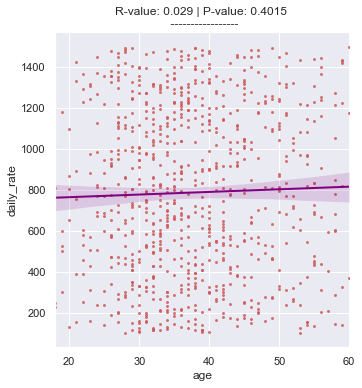

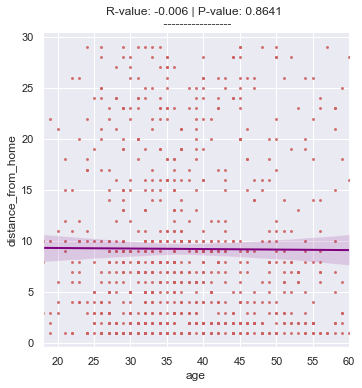

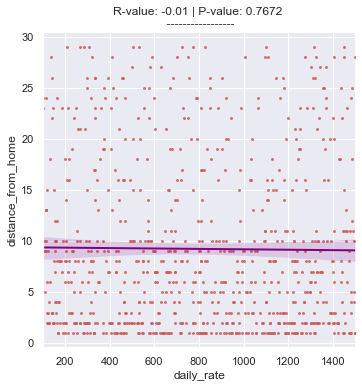

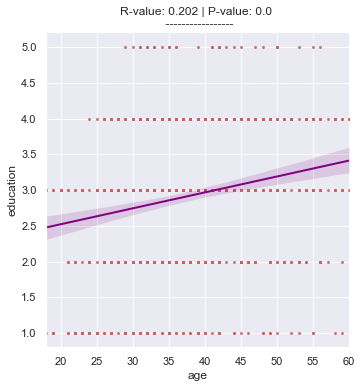

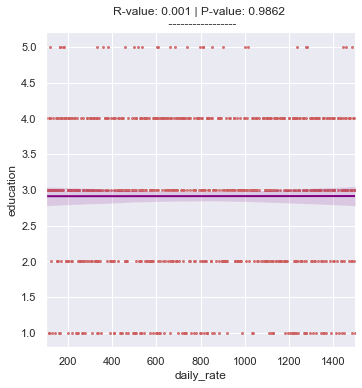

...

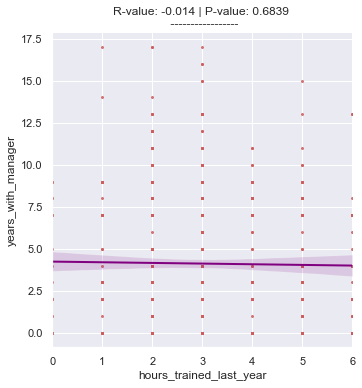

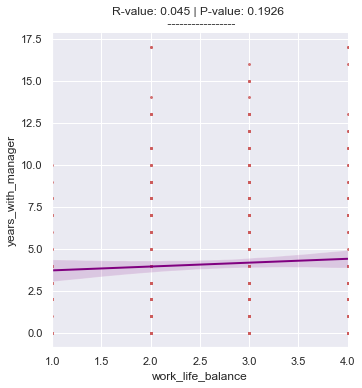

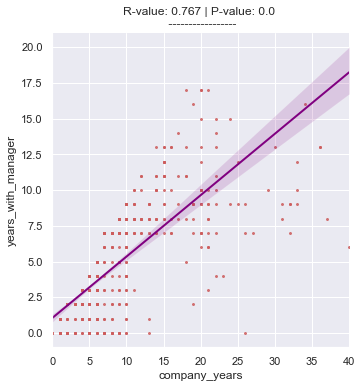

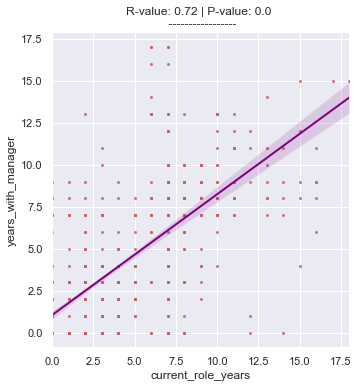

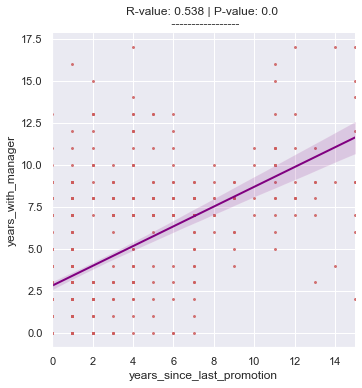

In [20]:
#explore linear relationships between continuous variables
explore.plot_variable_pairs(train, numeric)

### Takeaways
Small correlations:
* small correlation between education level and age (0.202)
* tiny negative correlation between hourly rate and environment satisfaction (-0.087)
* tiny correlation between job level and education level (0.087)
* tiny correlation between job level and environment satisfaction (.079)
* tiny negative correlation between job level and hourly rate (-0.072)?
* tiny negative correlation between job satisfaction and hourly rate (-0.091)
* tiny correlation between monthly income and education level (0.084)
* slight correlation between number of companies worked at and education level (0.122)
* slight correlation between number of companies worked at and job level (0.132)
* slight correlation between number of companies worked at and monthly income (0.143)
* slight correlation between total working years and education level (0.152)
* small correlation between total working years and number of companies worked at (0.24)
* tiny correlation between years at the company and education level (0.082)
* slight negative correlation between years at the company and number of companies worked at (-0.137)
* tiny negative correlation between years in current role and number of companies worked at (-0.092)
* small correlation between years in current role and age (0.195)
* tiny correlation between years in current role and number of stocks owned (0.084)
* tiny correlation between years in current role and work/ life balance (0.078)
* small correlation between years since last promotion and age (0.213)
* slight correlation between years with current manager and age (0.189)
* slight negative correlation between years with manager and number of companies worked at (-0.12)

Medium correlations:
* correlation between job level and age (0.492)
* correlation between monthly income and age (0.487)
* correlation between number of companies worked at and age (0.325)
* correlation between number of years at the company and age (0.294)
* correlation between years at the company and job level (0.532)
* correlation between years at the company and monthly income (0.515)
* correlation between years at the company and total working years-- duh (0.631)
* correlation between years in current role and job level (0.384)
* correlation between years in current role and monthly income (0.359)
* correlation between years in current role and total working years (0.457)
* correlation between years since last promotion and job level (0.338)
* correlation between years since last promotion and monthly income (0.334)
* correlation between years since last promotion and total working years (0.4)
* correlation between years since last promotion and company years (0.617)
* correlation between years since last promotion and years in current role (0.561)
* correlation between years with current manager and job level (0.381)
* correlation between years with manager and monthly income (0.34)
* correlation between years with manager and total working years (0.463)
* correlation between years with manager and years since last promotion (0.538)

#### Strong correlations:
* strong correlation between years in current role and years at the company (0.752)
* strong correlation between years with manager and company years (0.767)
* strong correlation between years with manager and years in current role (0.72)
* strong correlation between monthly income and job level (.955)
* strong correlation between performance rating and percent salary hike (0.768)
* strong correlation between total working years and age (0.655)
* strong correlation between total working years and job level (0.789)
* strong correlation between total working years and monthly income (0.78)

### Explore Q I
What is the total percentage of attrition? What is attrition like across departments?

In [21]:
print(f'Total count of employees departed: {len(df[df.attrition == 1])} / Total count of employees retained: {len(df[df.attrition == 0])}')
print(f'Total attrition is {round((len(df[df.attrition == 1]) / len(df)) * 100)}%')
print(f'Attrition in the train data set is {round((len(train[train.attrition == 1]) / len(train)) * 100)}%')

Total count of employees departed: 237 / Total count of employees retained: 1233
Total attrition is 16%
Attrition in the train data set is 16%


Sklearn stratified my split correctly.

In [22]:
#assign variables to respective department data
research_and_dev = train[train.department == 'Research & Development']
sales = train[train.department == 'Sales']
human_resources = train[train.department == 'Human Resources']

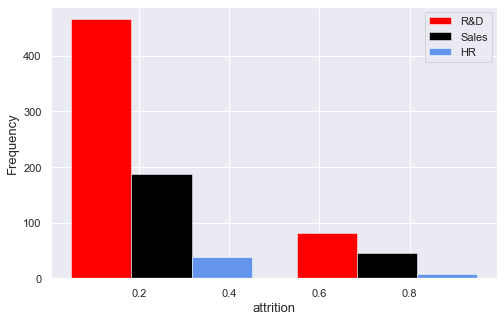

In [23]:
#compare attrition counts across departments
explore.juxtapose_distributions(research_and_dev, sales, human_resources, 'attrition')

### Takeaway
* attrition seems similarly proportioned throughout the departments

In [24]:
#print variable attrition percentages (the mean value of a column full of 1s for yes and 0 for no gives the ratio)
print(f'Research & Development attrition rate: {round(research_and_dev.attrition.mean() * 100)}%')
print(f'Sales attrition rate: {round(sales.attrition.mean() * 100)}%')
print(f'Human Resources attrition rate: {round(human_resources.attrition.mean() * 100)}%')

Research & Development attrition rate: 15%
Sales attrition rate: 19%
Human Resources attrition rate: 16%


The Sales department has the highest attrition rate. 
#### Is there a relationship between the Sales department and attrition?
Let's run a chi squared test.

#### Null hypothesis:  Working in the Sales department and attrition are independent of each other.
#### Alternate hypothesis: Working in the Sales department and attrition are associated.

In [25]:
#form a contingency table between attrition and the sales department
observed = pd.crosstab(train.attrition, train.sales_dept)
observed

sales_dept,0,1
attrition,,
0,503,187
1,88,45


In [26]:
#run chi squared test
explore.return_chi2(observed)

Observed
--------
[[503 187]
 [ 88  45]]
Expected
--------
[[495 194]
 [ 95  37]]
Degrees of Freedom: 1
Chi^2 and P
-----------
chi^2 = 2.1757
p = 0.1402


#### The high p-value indicates that I have failed to reject my null hypothesis that working in the sales department and attrition are independent of each other.

### Q I Takeaway
* Attrition is not associated with any department.